Name : JISHNU P

Roll no: CB.EN.P2AID19017

**Store Item Demand Forecasting**

## Objective : 
* To analyze the data and identify presence of  seasonality, trend in sales.

* Forcast the sales using ARIMA model for efficient production plannning.

## Store Item Demand Dataset
* Type : Time series Data.
* 5 years of store-item sales data (2013 - 2017)
* 10 different stores, 50 different items
* Attributes 'date', 'store', 'item', 'sales'
* 913000 entries.


In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [4]:
#pip install pmdarima

In [78]:
#Loading the data
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

Analysis of the Dataset

In [79]:
#overview of data
print("number of different items: %i" %(len(np.unique(train.item))))
print("number of different stores: %i" %(len(np.unique(train.store))))
print("number of different dates: %i" %(len(np.unique(train.date))))
print("maximun date in data: %s" %(max(train.date)))
print("minimum date in data: %s" %(min(train.date)))

number of different items: 50
number of different stores: 10
number of different dates: 1826
maximun date in data: 2017-12-31
minimum date in data: 2013-01-01


In [7]:
train.head()

,date,store,item,sales
0,2013-01-01,1,1.0,13.0
1,2013-01-02,1,1.0,11.0
2,2013-01-03,1,1.0,14.0
3,2013-01-04,1,1.0,13.0
4,2013-01-05,1,1.0,10.0


In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500739 entries, 0 to 500738
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   date    500739 non-null  object 
 1   store   500739 non-null  int64  
 2   item    500738 non-null  float64
 3   sales   500738 non-null  float64
dtypes: float64(2), int64(1), object(1)
memory usage: 15.3+ MB


Date is of 'object' type.

In [80]:
train.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


25% of the items had sales lower than 30, 50% of the items had sales lower than 47 and 75% had sales lower than 70. Highest sales were 231.

## Checking for null values in the training dataset

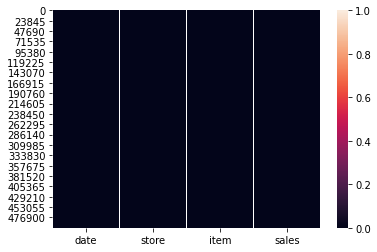

In [10]:
sns.heatmap(train.isnull())

There is no mising values in this dataset.

All 913000 rows are free from null values

In [11]:
test.head()

,id,date,store,item
0,0,2018-01-01,1,1
1,1,2018-01-02,1,1
2,2,2018-01-03,1,1
3,3,2018-01-04,1,1
4,4,2018-01-05,1,1


In [12]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      45000 non-null  int64 
 1   date    45000 non-null  object
 2   store   45000 non-null  int64 
 3   item    45000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.4+ MB


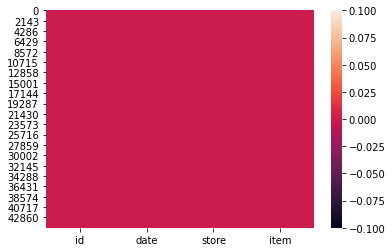

In [13]:
sns.heatmap(test.isnull())

## Adding more clarity to the dataset

* Converting date to datetime format
* Extracting dayofweek [0-monday,...... 6- sunday]
* Extracting dayofYear [1,2,3,4,5,....,364,365]
* Extracting the year from the date [2013,2014,2015,2016,2017]
* Extracting the month from the date [January, ......, december]


In [14]:
#converting date to datetime format
train['date']=pd.to_datetime(train['date'])
test['date']=pd.to_datetime(test['date'])

#Extracting dayofweek,dayofyear,year,month for training set

train['weekday']=train['date'].dt.dayofweek
train['dayofyear']=train['date'].dt.dayofyear
train['year']=train['date'].dt.year
train['month']=train['date'].dt.month

#Extracting dayofweek,dayofyear,year,month for testing set

test['weekday']=test['date'].dt.dayofweek
test['dayofyear']=test['date'].dt.dayofyear
test['year']=test['date'].dt.year
test['month']=test['date'].dt.month

In [15]:
train.head()

,date,store,item,sales,weekday,dayofyear,year,month
0,2013-01-01,1,1.0,13.0,1,1,2013,1
1,2013-01-02,1,1.0,11.0,2,2,2013,1
2,2013-01-03,1,1.0,14.0,3,3,2013,1
3,2013-01-04,1,1.0,13.0,4,4,2013,1
4,2013-01-05,1,1.0,10.0,5,5,2013,1


In [16]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500739 entries, 0 to 500738
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   date       500739 non-null  datetime64[ns]
 1   store      500739 non-null  int64         
 2   item       500738 non-null  float64       
 3   sales      500738 non-null  float64       
 4   weekday    500739 non-null  int64         
 5   dayofyear  500739 non-null  int64         
 6   year       500739 non-null  int64         
 7   month      500739 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(5)
memory usage: 30.6 MB


In [17]:
train.to_csv("train1.csv", index=False)

In [18]:
test.head()

,id,date,store,item,weekday,dayofyear,year,month
0,0,2018-01-01,1,1,0,1,2018,1
1,1,2018-01-02,1,1,1,2,2018,1
2,2,2018-01-03,1,1,2,3,2018,1
3,3,2018-01-04,1,1,3,4,2018,1
4,4,2018-01-05,1,1,4,5,2018,1


In [19]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   id         45000 non-null  int64         
 1   date       45000 non-null  datetime64[ns]
 2   store      45000 non-null  int64         
 3   item       45000 non-null  int64         
 4   weekday    45000 non-null  int64         
 5   dayofyear  45000 non-null  int64         
 6   year       45000 non-null  int64         
 7   month      45000 non-null  int64         
dtypes: datetime64[ns](1), int64(7)
memory usage: 2.7 MB


* Now we have the day wise(week day| year day), year wise, Month wise sales data to perform detailed analysis of sales of store item 

## Exploratory Data Analysis

In [20]:
import plotly.express as px
px.box(x=train['year'],y=train['sales'],title="Yearly Sales")

In [21]:
px.box(x=train['month'],y=train['sales'],title="Monthly Sales")

## Weekday wise impact on sales

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



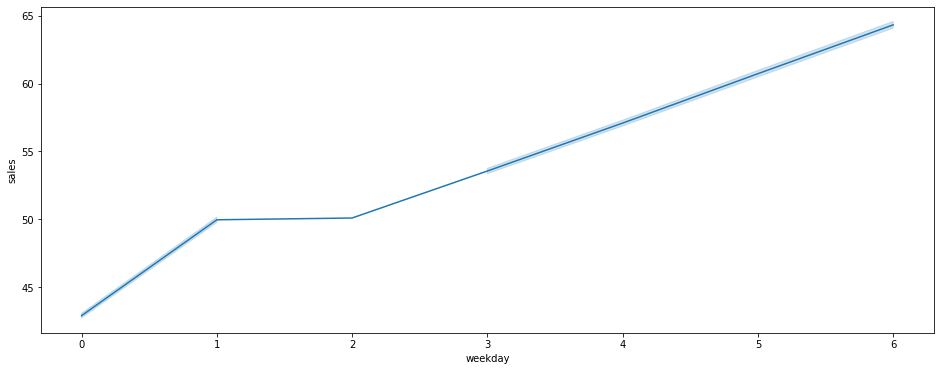

In [22]:
plt.figure(figsize=(16, 6))
sns.lineplot(train['weekday'],train['sales'])

In [23]:
train.columns

Index(['date', 'store', 'item', 'sales', 'weekday', 'dayofyear', 'year',
       'month'],
      dtype='object')

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Year vs Sales')

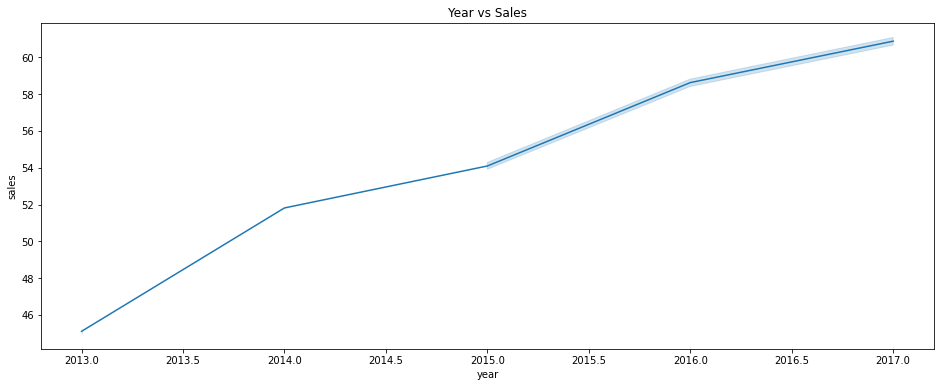

In [24]:
plt.figure(figsize=(16, 6))
sns.lineplot(train['year'],train['sales'])
plt.title("Year vs Sales")

## Annual sales among the stores

Text(0.5, 1.0, 'Sales among stores')

<Figure size 360x360 with 0 Axes>

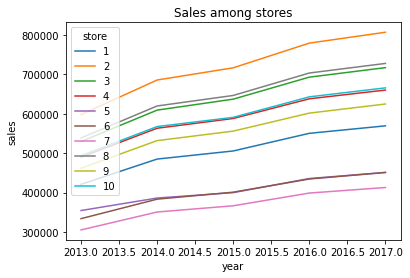

In [25]:
c=train.groupby(['year','store']).sum()
plt.figure(figsize=(5,5))
d=c.unstack()
d.plot(y='sales')
plt.ylabel('sales')
plt.title("Sales among stores")

## Monthly sales between stores

Text(0.5, 1.0, 'Monthly Sales among stores')

<Figure size 1080x720 with 0 Axes>

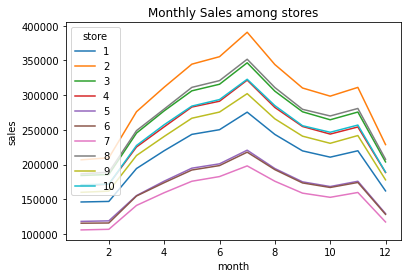

In [26]:
c= train.groupby(['month', 'store']).sum()
plt.figure(figsize=(15,10))
d=c.unstack()
d.plot(y='sales')
plt.ylabel('sales')
plt.title("Monthly Sales among stores")

## Weekly Sales on stores

Text(0.5, 1.0, 'Weekly Sales among stores')

<Figure size 1080x720 with 0 Axes>

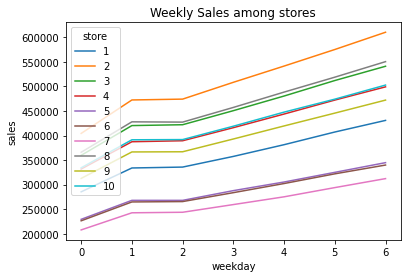

In [27]:
c=train.groupby(['weekday','store']).sum()
plt.figure(figsize=(15,10))
d=c.unstack()
d.plot(y='sales')
plt.ylabel('sales')
plt.title("Weekly Sales among stores")

Inference from EDA :
* We can see an upward trend in sales from the year 2013 to 2017
* Seasonality also present.(July)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Distribution of sales')

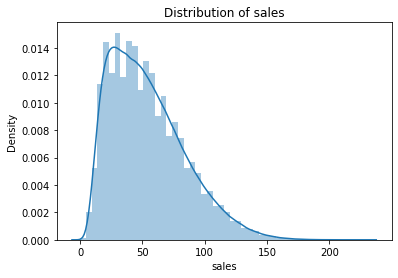

In [28]:
# Distribution of sales
sns.distplot(train["sales"])
plt.title("Distribution of sales")

Most Of the sales of item is in the range  40-50

There are 10 stores and 50 items to consider for sales analysis.

**Stationarity check**

* Stationarity is a property of a time series. A stationary series is one where the values of the series is not a function of time.

* That is, the statistical properties of the series like mean, variance and autocorrelation are constant over time

In [29]:
#Perform Augmented Dickey–Fuller test(ADF test):
  
from statsmodels.tsa.stattools import adfuller
def adf_test(time_series):
  
    result  =  adfuller(time_series, autolag = 'AIC')

    output  =  pd.Series(result[0:4], index = ['Test Statistic','p-value','no. of Lags Used','Number of Observations Used'])
    for key,value in result[4].items():
        
        output['Critical Value (%s)'%key]  =  value
    
    print('Summary of Augmented Dickey Fuller Test:') 
    print(output)

In [30]:

dateIndexed  =  train.set_index(['date'])
dateIndexed.head(5)


,store,item,sales,weekday,dayofyear,year,month
date,,,,,,,
2013-01-01,1,1.0,13.0,1,1,2013,1
2013-01-02,1,1.0,11.0,2,2,2013,1
2013-01-03,1,1.0,14.0,3,3,2013,1
2013-01-04,1,1.0,13.0,4,4,2013,1
2013-01-05,1,1.0,10.0,5,5,2013,1


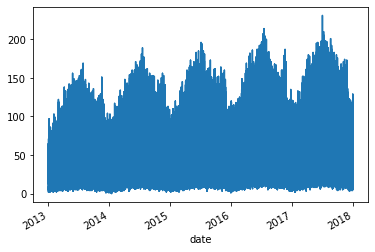

In [31]:
dateIndexed['sales'].plot()

In [32]:
dateIndexed.columns

Index(['store', 'item', 'sales', 'weekday', 'dayofyear', 'year', 'month'], dtype='object')

**Decomposition**


* we can perform a classical decomposition of a time series by considering the series as an additive or multiplicative combination of the base level, trend, seasonal index and the residual.

In [33]:
dateIndexed= dateIndexed.drop(columns=["store","item","year","month","dayofyear","weekday"])

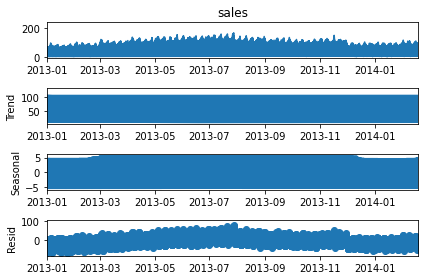

In [34]:
dateIndexed.dropna(inplace=True)
from statsmodels.tsa.seasonal import seasonal_decompose
fig = seasonal_decompose(dateIndexed['sales'],period =365).plot()

Considering the sales of a single store and a sigle item for getting more clarity during decomposition

In [35]:
store1item1 = train.loc[(train['store'] == 1) & (train['item'] == 1)]
store1item1= store1item1.drop(columns=["store","item","year","month","dayofyear","weekday"])
store1item1 = store1item1.set_index(['date'])

In [36]:
store1item1.head()

,sales
date,
2013-01-01,13.0
2013-01-02,11.0
2013-01-03,14.0
2013-01-04,13.0
2013-01-05,10.0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

the 'freq'' keyword is deprecated, use 'period' instead



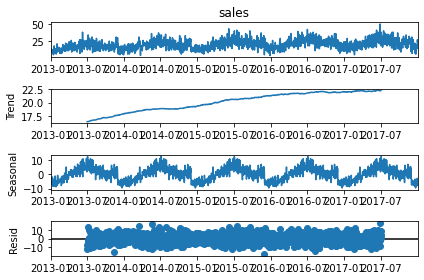

In [37]:
fig = seasonal_decompose(store1item1['sales'],freq=365).plot()


Here we can see a **trend** component and **seasonality** component in the plot.


Let's check the stationarity using the **ADF** test.

In [38]:
#adf_test(train['sales'])

Here also we can see that the  **test static  value**  is **larger than** the **critical values**. Again, meaning that we cannot reject the null hypothesis and in turn that the time **series is non-stationary**.

We require **differencing** to make it stationary

**Data transformation for making data stationary**

In [39]:
#Log transform 
store1item1_logScale  =  np.log(store1item1)

In [40]:

adf_test(store1item1.sales)

Summary of Augmented Dickey Fuller Test:
Test Statistic                   -3.157671
p-value                           0.022569
no. of Lags Used                 23.000000
Number of Observations Used    1802.000000
Critical Value (1%)              -3.433984
Critical Value (5%)              -2.863145
Critical Value (10%)             -2.567625
dtype: float64


In [41]:
#Log scale shifting
datasetLogDiffShifting  = store1item1_logScale - store1item1_logScale.shift()

In [42]:

datasetLogDiffShifting.dropna(inplace = True)
adf_test(datasetLogDiffShifting.sales)

Summary of Augmented Dickey Fuller Test:
Test Statistic                -1.259629e+01
p-value                        1.775858e-23
no. of Lags Used               2.200000e+01
Number of Observations Used    1.802000e+03
Critical Value (1%)           -3.433984e+00
Critical Value (5%)           -2.863145e+00
Critical Value (10%)          -2.567625e+00
dtype: float64


In [43]:

# Determine rolling statistics
def rolling_means(time_series):
    rolmean  =  time_series.rolling(window = 12).mean()    #window size 12 denotes 12 months, giving rolling mean at yearly level
    rolstd  =  time_series.rolling(window = 12).std()

    orig  =  plt.plot(time_series, color = 'blue', label = 'Original')
    mean  =  plt.plot(rolmean, color = 'red', label = 'Rolling Mean')
    std  =  plt.plot(rolstd, color = 'black', label = 'Rolling Std')
    plt.legend(loc = 'best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block = False)

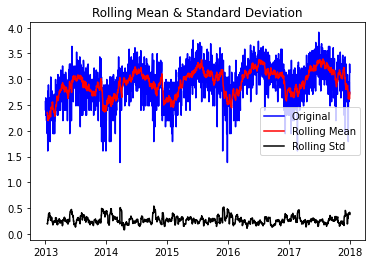

In [44]:
rolling_means(store1item1_logScale.sales)

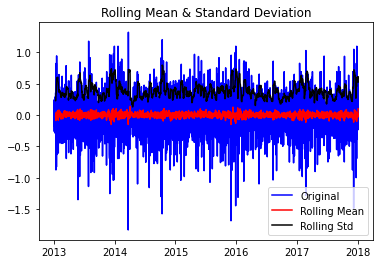

In [45]:

rolling_means(datasetLogDiffShifting)

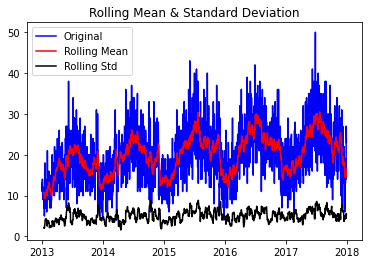

In [47]:
rolling_means(store1item1.sales)

the p-value is extremely small. Thus the series after transformation is very likely to be stationary.

**Choosing the parameters for ARIMA model**

**Finding degree of defferencing (d)**

**Plotting ACF & PACF** 

In [48]:

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.rcParams.update({'figure.figsize':(36,10), 'figure.dpi':120})

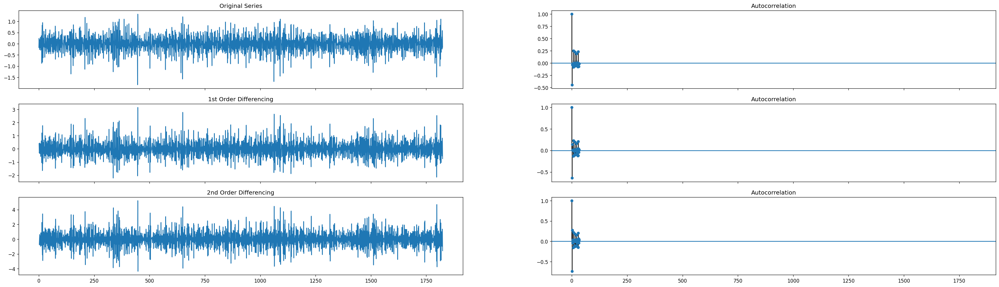

In [49]:
datasetLogDiffShifting = datasetLogDiffShifting.reset_index()
# Original Series
fig, axes = plt.subplots(3, 2, sharex=True)
axes[0, 0].plot(datasetLogDiffShifting.sales); axes[0, 0].set_title('Original Series')
plot_acf(datasetLogDiffShifting.sales, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(datasetLogDiffShifting.sales.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(datasetLogDiffShifting.sales.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(datasetLogDiffShifting.sales.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(datasetLogDiffShifting.sales.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

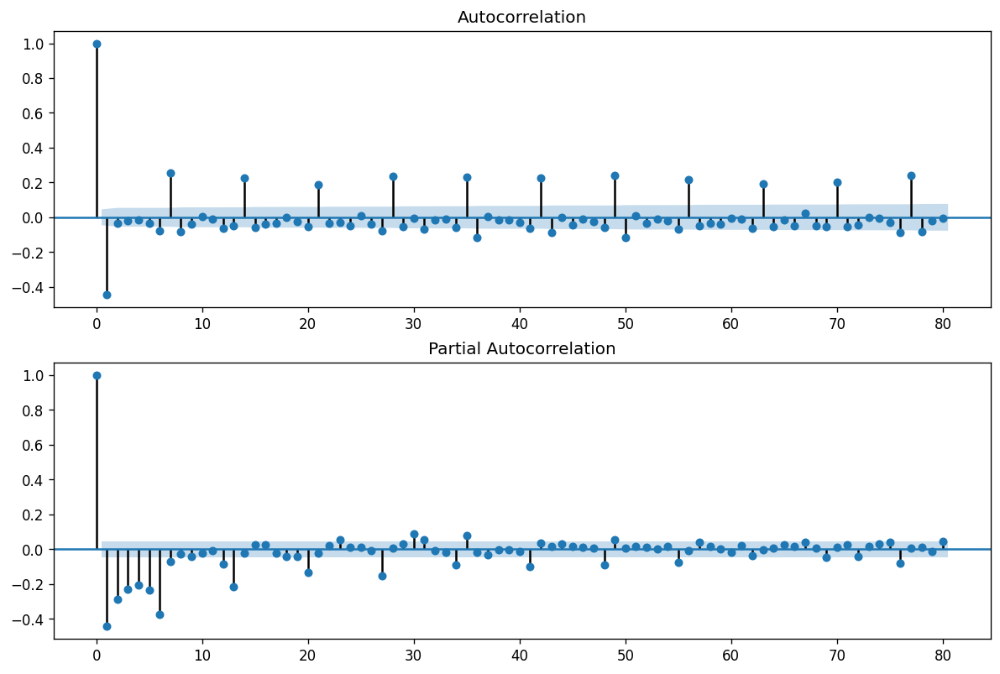

In [50]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = plot_acf(datasetLogDiffShifting.sales, lags=80, ax=ax1) 
ax2 = fig.add_subplot(212)
fig = plot_pacf(datasetLogDiffShifting.sales, lags=80, ax=ax2)




Here we can see the acf and pacf both has a pattern at every 7 periods. A weekly pattern exists. P, Q value - 7

On looking at the autocorrelation plot for the 1st differencing and the 2nd differencing and  no differencing(d = 0),  we can see that both 1 and 2 order differencing are almost same. In the autocorrelation plot for non differencing is almost stationary. so we can conclude that we need atleast difference order of 0 to make the series stationary

In [52]:
#1st derivative



adf_test(datasetLogDiffShifting.sales.diff().dropna())



Summary of Augmented Dickey Fuller Test:
Test Statistic                -1.614056e+01
p-value                        4.680870e-29
no. of Lags Used               2.500000e+01
Number of Observations Used    1.798000e+03
Critical Value (1%)           -3.433992e+00
Critical Value (5%)           -2.863149e+00
Critical Value (10%)          -2.567626e+00
dtype: float64


In [53]:
# 2nd derivative
adf_test(datasetLogDiffShifting.sales.diff().diff().dropna())


Summary of Augmented Dickey Fuller Test:
Test Statistic                  -22.755055
p-value                           0.000000
no. of Lags Used                 25.000000
Number of Observations Used    1797.000000
Critical Value (1%)              -3.433994
Critical Value (5%)              -2.863150
Critical Value (10%)             -2.567627
dtype: float64


In [54]:
datasetLogDiffShifting.head()

,date,sales
0,2013-01-02,-0.167054
1,2013-01-03,0.241162
2,2013-01-04,-0.074108
3,2013-01-05,-0.262364
4,2013-01-06,0.182322


In [55]:
from statsmodels.tsa.arima_model import ARIMA

In [88]:
# on training dataset
X = datasetLogDiffShifting.sales
size = int(len(X) * 0.75)
train, test = X[0:size], X[size:len(X)]
model = ARIMA(train, order=(7,0,7))
model_fit = model.fit(disp=0);

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



,0
count,1368.000000
mean,-0.000601
std,0.259903
min,-1.327229
25%,-0.145301
50%,0.028525
75%,0.165858
max,0.731025


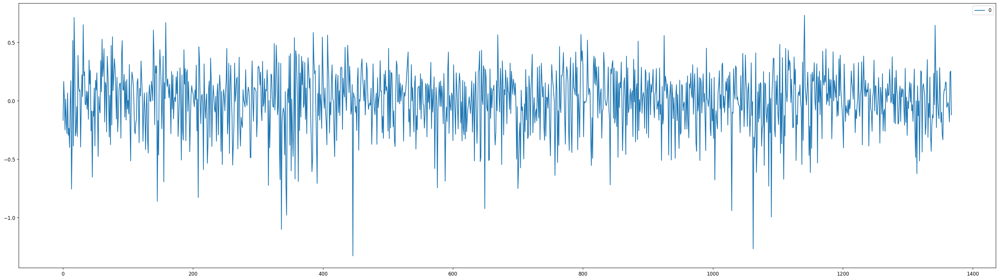

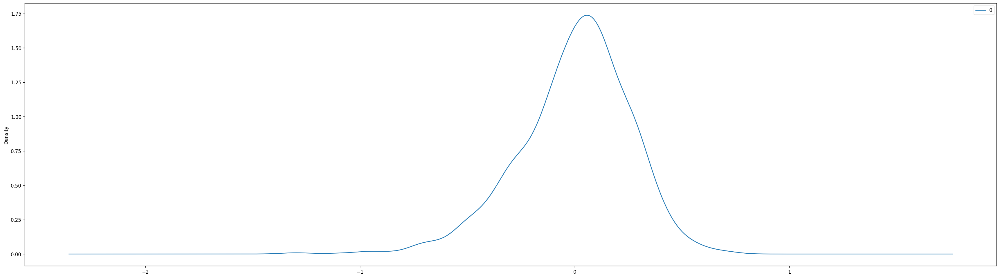

In [57]:
from pandas import DataFrame
# plot residual errors

residuals = DataFrame(model_fit.resid)
residuals.plot()
residuals.plot(kind='kde')
residuals.describe()

we get a density plot of the residual error values, suggesting the errors are Gaussian, but may not be centered on zero.


In [58]:
print(model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  sales   No. Observations:                 1368
Model:                     ARMA(7, 7)   Log Likelihood                 -96.864
Method:                       css-mle   S.D. of innovations              0.257
Date:                Thu, 03 Dec 2020   AIC                            225.728
Time:                        09:48:32   BIC                            309.265
Sample:                             0   HQIC                           256.992
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0006      0.001      0.737      0.461      -0.001       0.002
ar.L1.sales    -0.9826      0.000  -7790.613      0.000      -0.983      -0.982
ar.L2.sales    -0.9817      0.001  -1602.016    

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/arima_model.py:1521: RuntimeWarning:

invalid value encountered in sqrt



**Optimal ARIMA using out-of-time cross validation**

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/arima_mode

                              ARMA Model Results                              
Dep. Variable:                  sales   No. Observations:                 1368
Model:                     ARMA(7, 7)   Log Likelihood                 -96.864
Method:                       css-mle   S.D. of innovations              0.257
Date:                Thu, 03 Dec 2020   AIC                            225.728
Time:                        09:49:43   BIC                            309.265
Sample:                             0   HQIC                           256.992
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0006      0.001      0.737      0.461      -0.001       0.002
ar.L1.sales    -0.9826      0.000  -7790.613      0.000      -0.983      -0.982
ar.L2.sales    -0.9817      0.001  -1602.016    

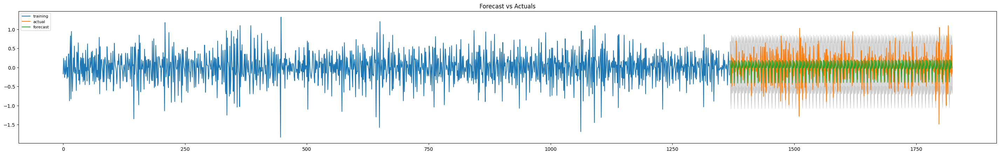

In [59]:
model = ARIMA(train, order=(7,0,7))  
fitted = model.fit(disp=-1)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(457, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(36,5), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [74]:

from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
import math
error = mean_squared_error(train, model_fit.fittedvalues)
print('Train MSE: %.3f' % error)
print('Train RMSE : %.3f' % math.sqrt(error))

Train MSE: 0.068
Train RMSE : 0.260


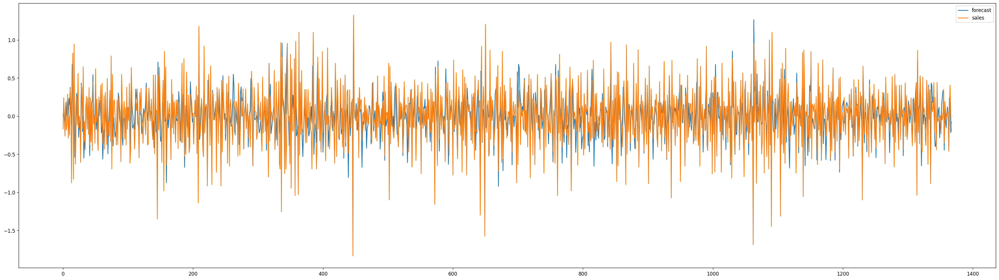

In [61]:
model_fit.plot_predict(dynamic=False)
plt.show()

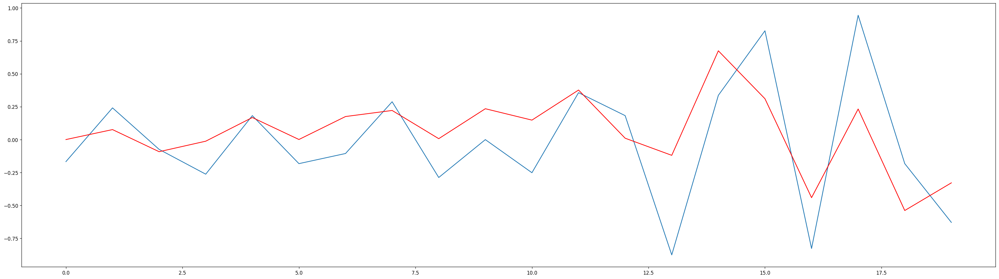

In [62]:

train.head(20).plot()
model_fit.fittedvalues.head(20).plot(color='red')


**Test the model**

In [63]:
predictions = model_fit.predict(start=len(train), end=len(datasetLogDiffShifting)-1, dynamic=False)

In [75]:

error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)
print('Test RMSE : %.3f' % math.sqrt(error))

Test MSE: 0.117
Test RMSE : 0.343


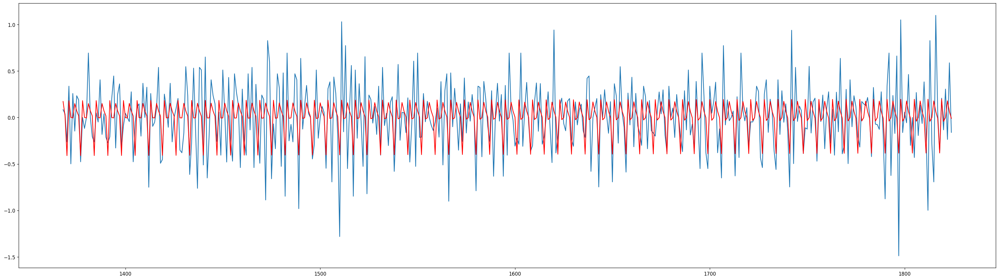

In [65]:
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [66]:
# def smape(A, F):
#     return 100/len(A) * np.sum(2 * np.abs(F - A) / (np.abs(A) + np.abs(F)))

In [76]:
#print("SMAPE score:",smape(train, model_fit.fittedvalues))

 ******************************************************************************

**Auto ARIMA** 

In [68]:
# pip install pmdarima

In [69]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

In [70]:
auto_model = pm.auto_arima(datasetLogDiffShifting.sales, start_p=7, start_q=7,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=7, max_q=7, # maximum p and q
                      m= 1,              # frequency of series
                      d= None,           # let model determine 'd'
                      seasonal=True,   #  Seasonality
                      
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(7,0,7)(0,0,0)[0] intercept   : AIC=inf, Time=11.08 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1707.233, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1307.989, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=712.268, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1705.235, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=707.979, Time=0.88 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=706.215, Time=1.26 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1152.204, Time=0.34 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=695.550, Time=1.82 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1056.757, Time=0.52 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=679.732, Time=2.73 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=980.438, Time=0.64 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=659.351, Time=3.51 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=880.267, Time=0.80 sec
 ARIMA(6,0,1)(0,0,0)[0] intercept   : AIC=601

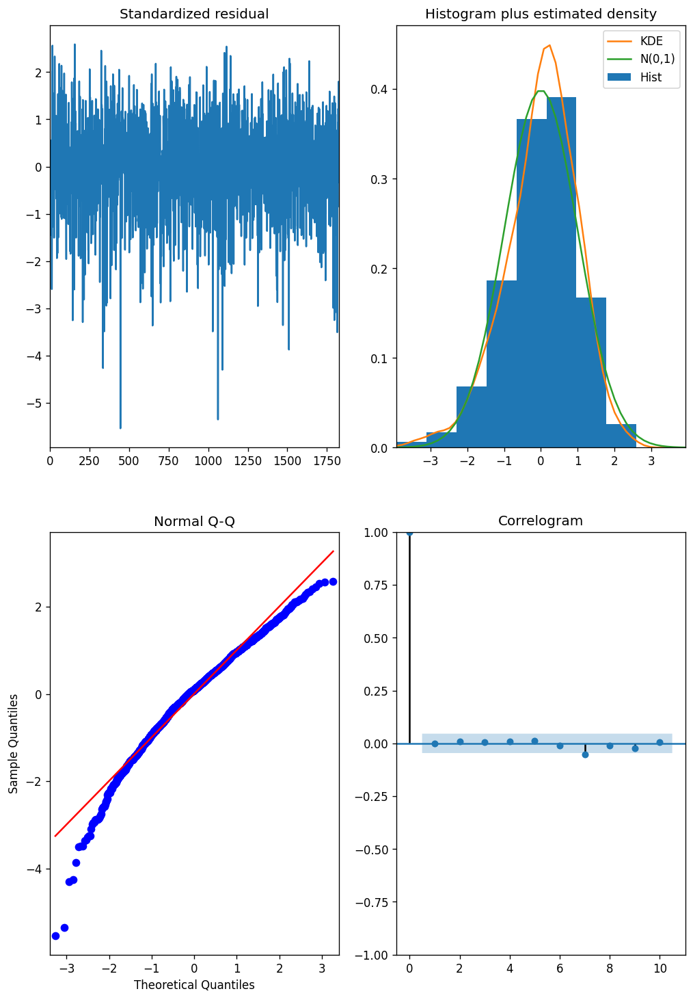

In [71]:
#Residual plots
auto_model.plot_diagnostics(figsize=(10,15))
plt.show()

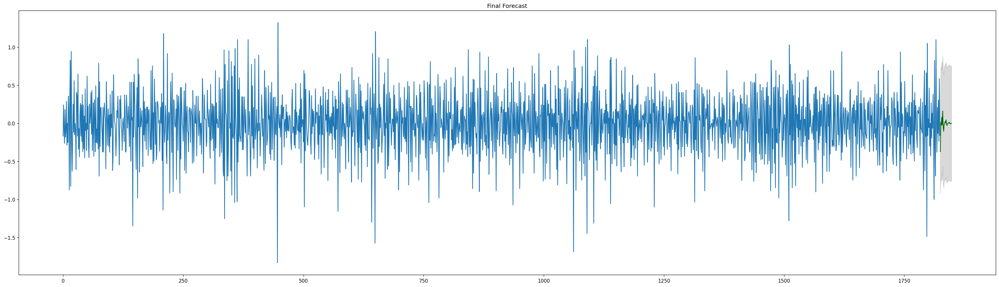

In [72]:
n_periods = 24
import pmdarima as pm
fc, confint = auto_model.predict(n_periods=n_periods, return_conf_int=True)
index_of_fc = np.arange(len(datasetLogDiffShifting.sales), len(datasetLogDiffShifting.sales)+n_periods)

# make series for plotting purpose
fc_series = pd.Series(fc, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.plot(datasetLogDiffShifting.sales)
plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)

plt.title("Final Forecast")
plt.show()

**Conclusion**
* Successfully identified the trend, seasonal components in the data.
* Forcasted the demand of item using ARIMA model.